# Tutorial 5: Breast Cancer

## Import Modules

In [1]:
import scanpy as sc
import squidpy as sq
import sys
sys.path.append(r"/home/yqzhou/JUPYTER/MyPackage/Pianno")
import pianno as po
import json
from os.path import join
import matplotlib.pyplot as plt
import matplotlib as mpl

# Data input

In [2]:
# Setting the data and configuration file storage path.
sample_name = "BRCA-A"
config_path = "/home/yqzhou/JUPYTER/Revision/Tutorials/" + sample_name
adata = sc.read(join(config_path, "pianno_adata.h5ad"))

# (Optional) Step1：Automatic hyper-parameter selection

In [3]:
# Specify a known marker gene for each pattern
# If there is a pattern that does not know its marker gene, it can be set to []
# Allow only one pattern's marker gene to be set to []
Patterndict = {
    'Stroma': ['MMP2'],
    'DCIS': ['SERPINA3'],
    'Invasive': ['FASN'],
    'ACTA2+ Myoepi.': ['ACTA2'],
    'KRT15+ Myoepi.': ['KRT15'],   
    'Endothelial': ['AQP1'],
    'Macrophages': ['CD68'],
    'B Cell': ['CD79A'],
    'T Cell': ['CD8A'],
    'Mast Cell': ['CPA3']
}

Configuration path of Pianno: /home/yqzhou/JUPYTER/Revision/Tutorials/BRCA-A
[2024-01-17 23:44:33] Creating experiment, Experiment ID: ftl41n0g
[2024-01-17 23:44:33] Starting web server...
[2024-01-17 23:44:34] Setting up...
[2024-01-17 23:44:34] Web UI URLs: http://127.0.0.1:8080 http://10.10.10.7:8080 http://11.11.11.7:8080
[2024-01-17 23:54:45] Stopping experiment, please wait...
[2024-01-17 23:54:48] Experiment stopped


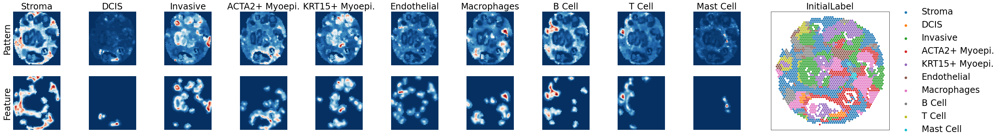

In [4]:
# If the connection fails, try a few more times.
# Open the Web UI URLs to visualize the hyperparameter tuning process.
# The default experiment lasts for a maximum of 10 minutes, 
# which can be modified according to the actual situation.
adata = po.AutoPatternRecognition(adata,
                                  Patterndict=Patterndict,
                                  config_path=config_path,
                                  param_tuning=True,
                                  max_experiment_duration='10m')

In [5]:
# Print the optimal parameters saved in the previous step.
with open(join(config_path, "best_params.json"),'r') as f:
    best_params_dict = json.load(f)
for key in best_params_dict:
    best_params = best_params_dict[key]  
best_params

{'n_class': 3,
 'dilation_radius': 3.0,
 'denoise_weight': 0.01,
 'unsharp_radius': 1.0,
 'unsharp_amount': 3.0,
 'gaussian_blur': 1.0}

# (Optional) Step2：Marker Selection

In [6]:
# Take the top 10 DEGs as candidate marker genes to make a proposed patterndict
Patterndict = po.ProposedPatterndict(adata, top_n=10)

Stroma
['CCDC80', 'MFAP4', 'SFRP2', 'PODN', 'C1R', 'DCN', 'MMP2', 'FBLN1', 'IGF1', 'COL14A1']


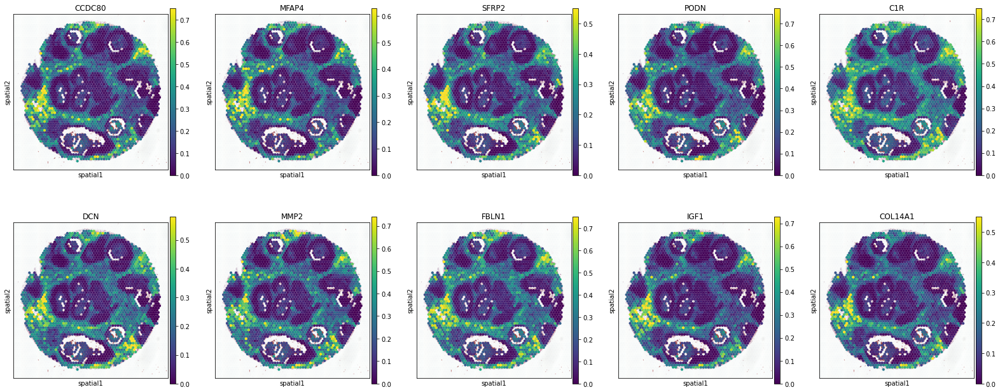

DCIS
['C5orf46', 'SERPINA3', 'FN1', 'GABRP', 'C12orf49', 'CST6', 'WDR86', 'B4GALT1', 'TGM2', 'MGAT4B']


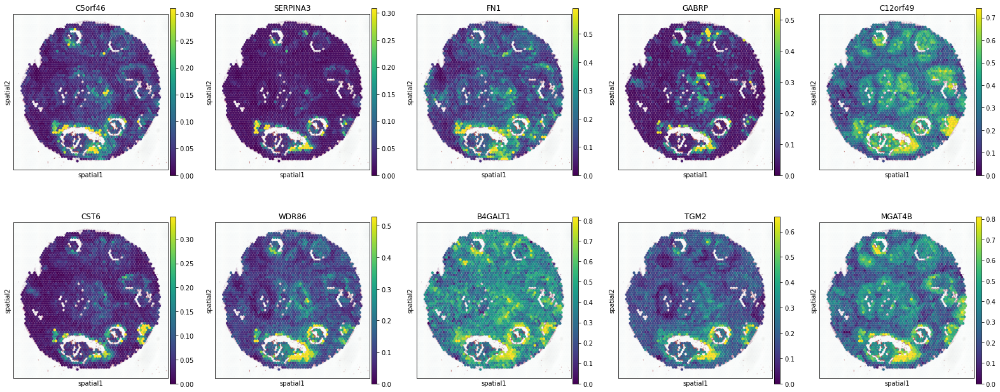

Invasive
['MPP3', 'FASN', 'PPP1R1A', 'GAL3ST2', 'SQLE', 'TRPS1', 'NPNT', 'DEGS2', 'FADS2', 'TMEM67']


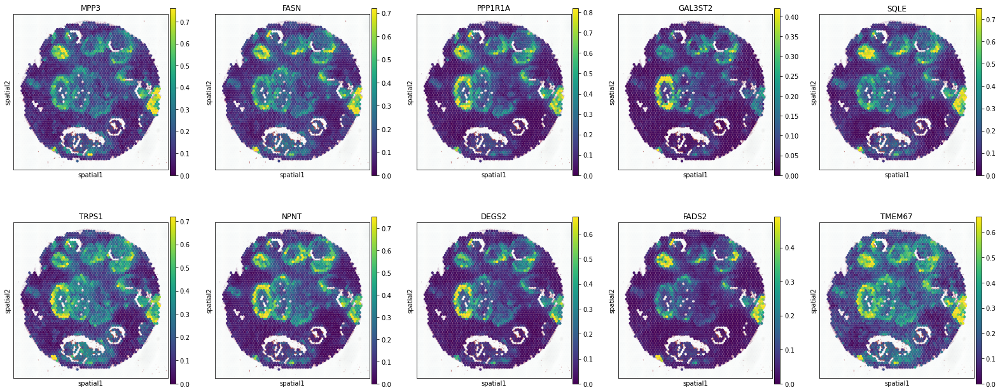

ACTA2+ Myoepi.
['IBSP', 'SULF1', 'PMEPA1', 'MICAL2', 'FN1', 'C5orf46', 'ACTN1', 'ACTA2', 'INHBA', 'MYL9']


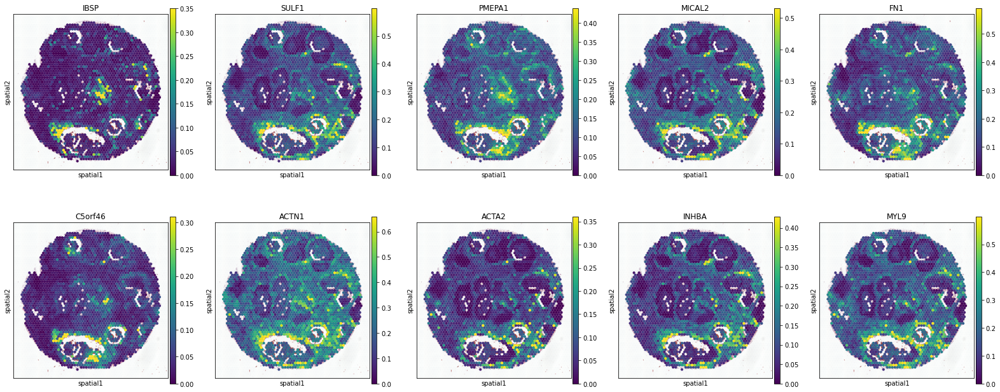

KRT15+ Myoepi.
['SPATS2L', 'VNN2', 'ART3', 'LY6E', 'VNN3', 'SLPI', 'ADGRF1', 'KLF5', 'OGFRL1', 'SLC34A2']


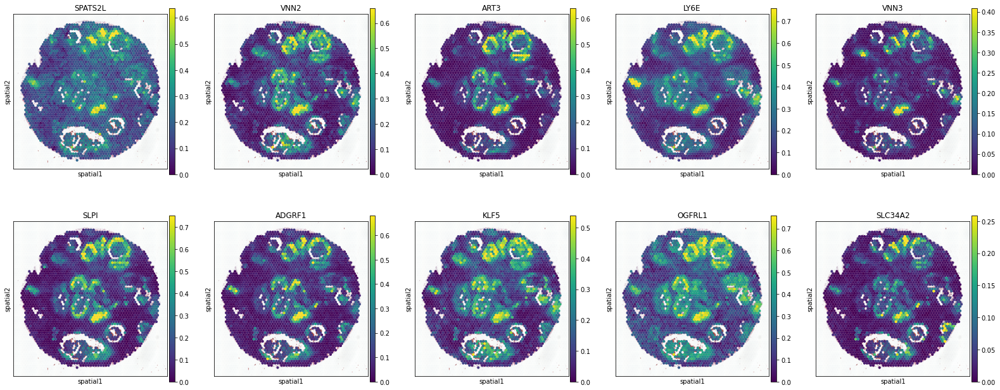

Endothelial
['ACKR1', 'VWF', 'CCL14', 'CCL19', 'APLNR', 'PTGDS', 'AQP1', 'JCHAIN', 'RAMP3', 'C7']


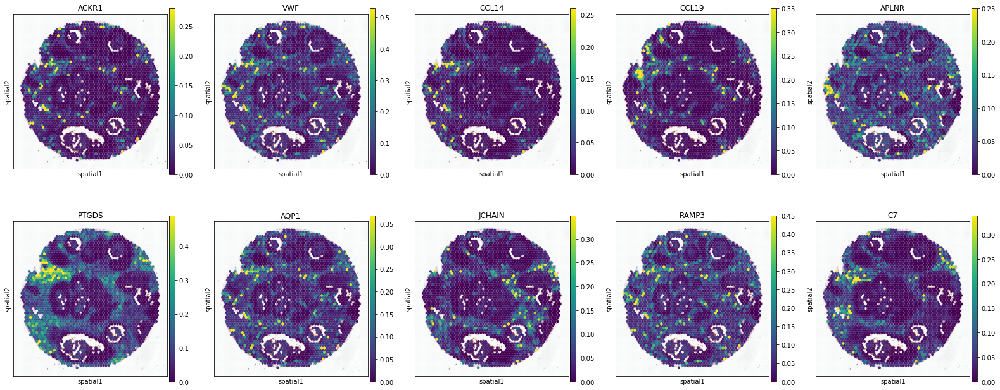

Macrophages
['GCHFR', 'CD63', 'RMDN3', 'GLUL', 'RNF130', 'LGALS3', 'GM2A', 'ASAH1', 'CTSD', 'TTYH3']


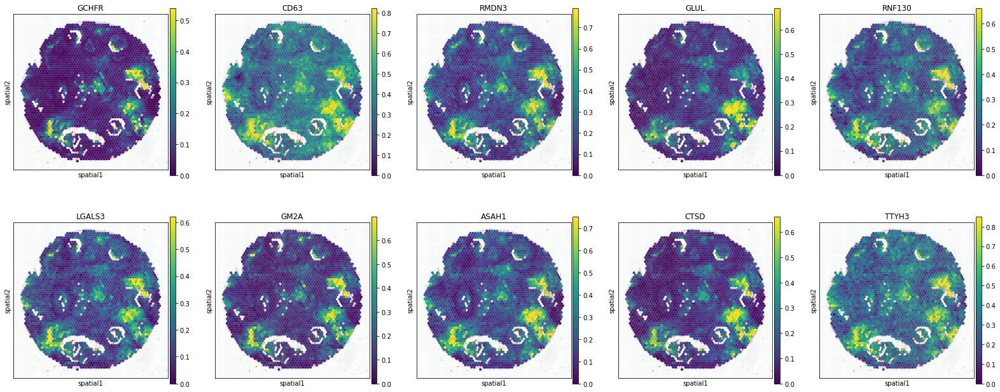

B Cell
['NIBAN3', 'MAP4K1', 'CD79A', 'CD27', 'ATP2A3', 'BLK', 'TRAJ16', 'TXNIP', 'TBC1D10C', 'TRAJ31']


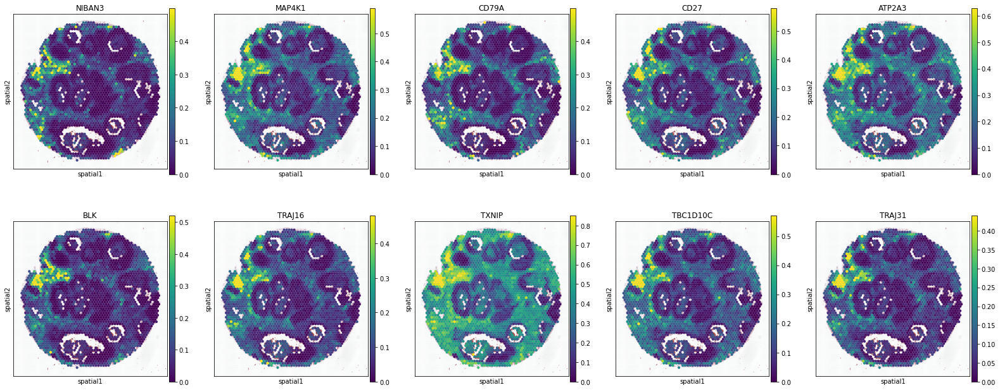

T Cell
['CCL5', 'PSMB9', 'APOL3', 'CXCL9', 'IRF1', 'TRAFD1', 'STAT1', 'LAG3', 'SLFN5', 'GBP2']


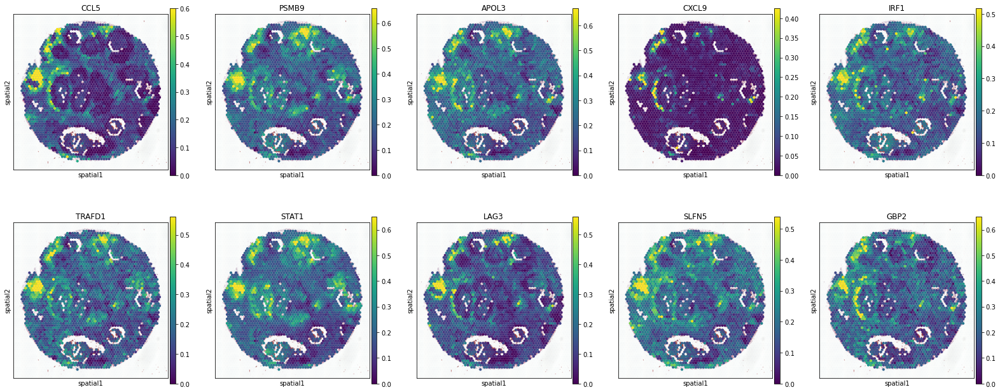

Mast Cell
['IGLV6-57', 'CPA3', 'JCHAIN', 'IGHG1', 'CXCL14', 'IGKV5-2', 'CXCL13', 'GNAT3']


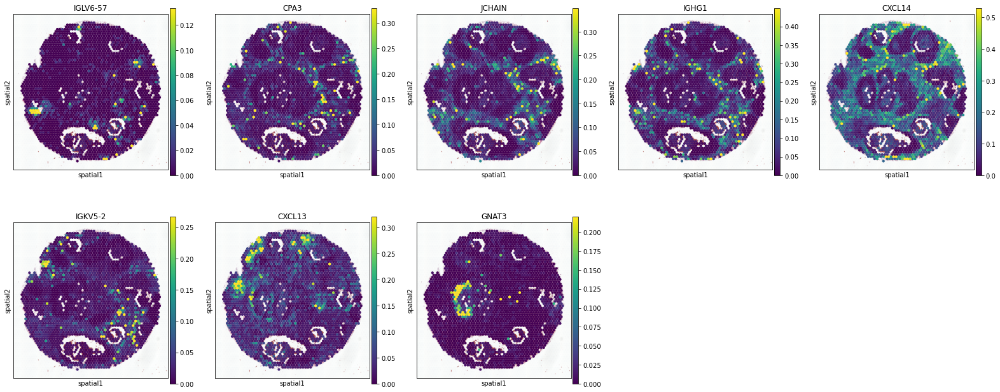

In [7]:
# Visualization of candidate marker genes
for k, v in Patterndict.items():
    print(k)
    print(v)
    with mpl.rc_context({'axes.facecolor':  'black',
                         'figure.figsize': [4.5, 5]}):
        sc.pl.spatial(adata, #cmap='magma',
                      layer='DenoisedX',
                      color=v,
                      ncols=5, size=10,
                      spot_size=30,
                      vmin=0, vmax='p99'
                     )

# Step3：Initial Pattern Recognition

In [8]:
# Construct the marker list by selecting 1-3 genes for each pattern 
# from the above candidate marker genes.
Patterndict = {
    'Stroma': ['MMP2', 'PODN'],
    'DCIS': ['SERPINA3', 'GABRP'],
    'Invasive': ['FASN', 'PPP1R1A', 'TRPS1'],
    'ACTA2+ Myoepi.': ['ACTA2'],
    'KRT15+ Myoepi.': ['KRT15'],   
    'Endothelial': ['AQP1', 'CCL14', 'VWF'],
    'Macrophages': ['CD68', 'GM2A', 'CTSD'],
    'B Cell': ['CD79A', 'MS4A1', 'BANK1'],
    'T Cell': ['CD8A', 'CCL5', 'CXCL9'],
    'Mast Cell': ['CPA3', 'JCHAIN']
}

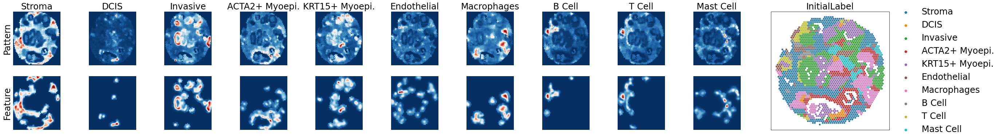

In [9]:
adata = po.AutoPatternRecognition(adata,
                                  Patterndict=Patterndict,
                                  config_path=config_path,
                                  param_tuning=False)

# Step4：Annotation Improvement

---Create Spatial Graph: Done!
---Compute Spatial Energy: Done!
---Find K-Nearest Neighbor in UMAP: Done!
---Compute KNN Energy: Done!
---Compute Global Energy: Done!


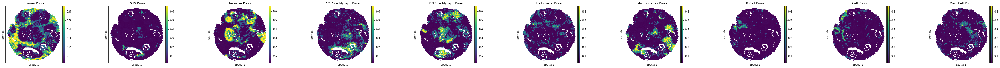

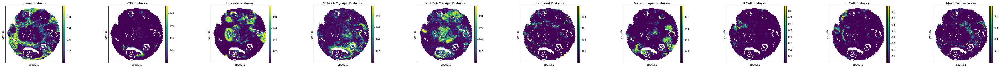

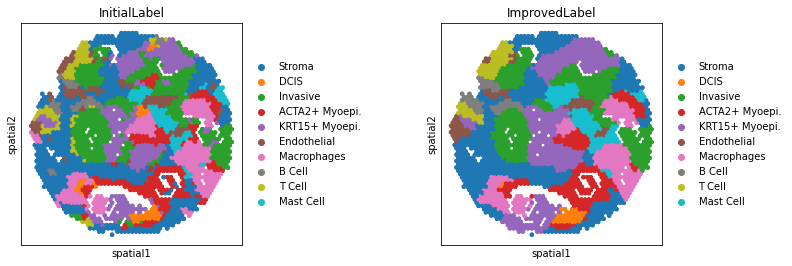

In [10]:
adata = po.AnnotationImprovement(adata)

---Create Spatial Graph: Done!
---Compute Spatial Energy: Done!
---Find K-Nearest Neighbor in UMAP: Done!
---Compute KNN Energy: Done!
---Compute Global Energy: Done!


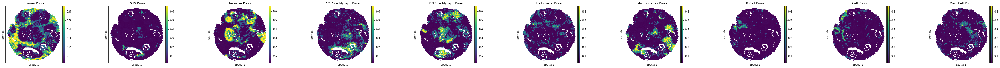

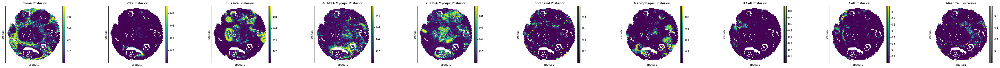

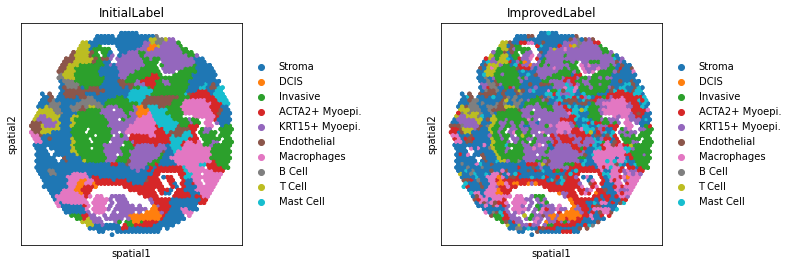

In [11]:
# If you want to preserve details, set the threshold of small objects to 0.
# If you want to annotate the cell type, it is recommended to use the "argmax" method.
# The "argmax" assigns cell types directly based on posterior probabilities, 
# to avoid excessive spatial smoothing and to preserve more details.
adata = po.AnnotationImprovement(adata,
                                 small_objects=0,
                                 method="argmax")